# Testing HealPix ICON C3

In [1]:
#%pip install --user healpy

In [2]:
import intake
import cartopy.crs as ccrs
import cartopy.feature as cf
import cmocean
import healpy as hp
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import healpy
from matplotlib import cm

/home/b/b382006/.local/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


### This function will ask the plot axes for their projection and use this information to sample (nearest-neighbor) variable in healpix nested ordering at a given resolution.

In [3]:
def nnshow(var, nx=1000, ny=1000, ax=None, **kwargs):
    """
    var: variable on healpix coordinates (array-like)
    nx: image resolution in x-direction
    ny: image resolution in y-direction
    ax: axis to plot on
    kwargs: additional arguments to imshow
    """
    if ax is None:
        ax = plt.gca()

    xlims = ax.get_xlim()
    ylims = ax.get_ylim()
    xvals = np.linspace(xlims[0], xlims[1], nx)
    yvals = np.linspace(ylims[0], ylims[1], ny)
    xvals2, yvals2 = np.meshgrid(xvals, yvals)
    latlon = ccrs.PlateCarree().transform_points(
        ax.projection, xvals2, yvals2, np.zeros_like(xvals2)
    )
    valid = np.all(np.isfinite(latlon), axis=-1)
    points = latlon[valid].T
    pix = hp.ang2pix(
        hp.npix2nside(len(var)), theta=points[0], phi=points[1], nest=True, lonlat=True
    )
    res = np.full(latlon.shape[:-1], np.nan, dtype=var.dtype)
    res[valid] = var[pix]
    return ax.imshow(res, extent=xlims + ylims, origin="lower", **kwargs)

In [4]:
def worldmap(var, **kwargs):
    projection = ccrs.Robinson(central_longitude=-135.5808361)
    #projection = ccrs.NorthPolarStereo()
    fig, ax = plt.subplots(
        figsize=(12, 10), subplot_kw={"projection": projection}, constrained_layout=True
    )
    #ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree()); 
    ax.set_global()

    nnshow(var, ax=ax, **kwargs)
    ax.add_feature(cf.COASTLINE, linewidth=0.8)
    ax.add_feature(cf.BORDERS, linewidth=0.4)

In [5]:
def get_nest(dx):
    return dx.crs.healpix_order == "nest"


def get_nside(dx):
    return dx.crs.healpix_nside


def attach_coords(ds):
    lons, lats = healpy.pix2ang(
        get_nside(ds), np.arange(ds.dims["cell"]), nest=get_nest(ds), lonlat=True
    )
    return ds.assign_coords(
        lat=(("cell",), lats, {"units": "degree_north"}),
        lon=(("cell",), lons, {"units": "degree_east"}),
    )

In [6]:
def hacky_linear_interpolation(data, target_grid, target_value, dim="level_full"):
    level_above = (target_grid > target_value).argmax(dim=dim)
    level_below = level_above - 1
    value_above = target_grid.isel(**{dim: level_above})
    value_below = target_grid.isel(**{dim: level_below})
    f = (target_value - value_below) / (value_above - value_below)
    return (1-f) * data.isel(**{dim: level_below}) + f * data.isel(**{dim: level_above})


## Plotting blocking

In [7]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from matplotlib import cm

In [8]:
### DATA MODEL

In [9]:
###==resample later
cat = intake.open_catalog("https://data.nextgems-h2020.eu/catalog.yaml")
ds_fine = cat["ICON"]["ngc3028"](zoom=7, time="P1D",chunks="auto").to_dask()

In [10]:
ds_fine

<xarray.Dataset>
Dimensions:                              (time: 2010, depth_half: 129,
                                          cell: 196608, level_full: 90, crs: 1,
                                          depth_full: 128,
                                          soil_depth_water_level: 5,
                                          level_half: 91,
                                          soil_depth_energy_level: 5)
Coordinates:
  * crs                                  (crs) float32 nan
  * depth_full                           (depth_full) float32 1.0 ... 5.904e+03
  * depth_half                           (depth_half) float32 0.0 ... 6.003e+03
  * level_full                           (level_full) int32 1 2 3 4 ... 88 89 90
  * level_half                           (level_half) int32 1 2 3 4 ... 89 90 91
  * soil_depth_energy_level              (soil_depth_energy_level) float32 0....
  * soil_depth_water_level               (soil_depth_water_level) float32 0.0...
  * time                                 (time) datetime64[ns] 2020-01-21 ......
    zg                                   (level_full, cell) float32 dask.array<chunksize=(90, 196608), meta=np.ndarray>
    zghalf                               (level_half, cell) float32 dask.array<chunksize=(91, 196608), meta=np.ndarray>
Dimensions without coordinates: cell
Data variables: (12/92)
    a_tracer_v_to                        (time, depth_half, cell) float32 dask.array<chunksize=(2, 66, 196608), meta=np.ndarray>
    atmos_fluxes_frshflux_evaporation    (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>
    atmos_fluxes_frshflux_precipitation  (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>
    atmos_fluxes_frshflux_runoff         (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>
    atmos_fluxes_frshflux_snowfall       (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>
    atmos_fluxes_heatflux_latent         (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>
    ...                                   ...
    va                                   (time, level_full, cell) float32 dask.array<chunksize=(2, 60, 196608), meta=np.ndarray>
    vas                                  (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>
    w                                    (time, depth_half, cell) float32 dask.array<chunksize=(2, 66, 196608), meta=np.ndarray>
    wa_phy                               (time, level_half, cell) float32 dask.array<chunksize=(2, 62, 196608), meta=np.ndarray>
    wind_speed_10m                       (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>
    zos                                  (time, cell) float32 dask.array<chunksize=(170, 196608), meta=np.ndarray>

In [11]:
# Find the HEALPix pixels that are closest to the 1x1 degree grid points.
lon = np.arange(0, 360, 1)
lat = np.arange(90, -91, -1)
pix = xr.DataArray(
    hp.ang2pix(ds_fine.crs.healpix_nside, *np.meshgrid(lon, lat), nest=True, lonlat=True),
    coords=(("lat", lat), ("lon", lon)),
)

In [12]:
### Give full pixs
prs1=25000
prs2=50000
prs3=85000
prs4=70000
###=== Daily select dates [#'2021-01-24',  ("2021-04-09" , "2021-04-11"), '2022-02-01']
#date='2021-01-24'
#date="2021-04-11"
#date="2022-02-01" 

###=== Daily select period
start="2021-01-20"
end="2021-01-26"

#start="2021-04-01"
#end="2021-04-17"

#start="2022-01-30"
#end="2022-02-01"

### summer
#start="2024-05-22"
#end="2024-06-06"

#start='2023-08-04'
#end="2023-08-13"

var_500 = hacky_linear_interpolation(ds_fine.zg, ds_fine.pfull.sel(time=slice(start, end)).compute(), prs2)
var_250 = hacky_linear_interpolation(ds_fine.ua.sel(time=slice(start, end)), ds_fine.pfull.sel(time=slice(start, end)).compute(), prs1)
vvar_250 = hacky_linear_interpolation(ds_fine.va.sel(time=slice(start, end)), ds_fine.pfull.sel(time=slice(start, end)).compute(), prs1)
#var_700 = hacky_linear_interpolation(ds_fine.hus.sel(time=slice(start, end)), ds_fine.pfull.sel(time=slice(start, end)).compute(), prs4)
#var_500

In [13]:
#ds_fine.tas

In [14]:
### Save 3D variable
#var_500
var='zg'
sample = np.reshape(var_500.isel(cell=pix).values,newshape=(len(var_500.time),len(lat),len(lon)))
#sample

# create DataArray with proper name, dimensions, and coordinates

var0 = xr.DataArray(
        data=sample,
        name=var,
        dims=["time","lat", "lon"],
        coords=dict(
            lon=lon,
            lat=lat,
            time=var_500.time,
        ),
        attrs=dict(
           ds_fine[var].attrs,
        ),
)


###=== Save 3D variable
var='ua'
sample = np.reshape(var_250.isel(cell=pix).values,newshape=(len(var_250.time),len(lat),len(lon)))
#sample

# create DataArray with proper name, dimensions, and coordinates

var1 = xr.DataArray(
        data=sample,
        name=var,
        dims=["time","lat", "lon"],
        coords=dict(
            lon=lon,
            lat=lat,
            time=var_250.time,
        ),
        attrs=dict(
           ds_fine[var].attrs,
        ),
)

###=== Save 
var='va'
sample = np.reshape(vvar_250.isel(cell=pix).values,newshape=(len(vvar_250.time),len(lat),len(lon)))
#sample

# create DataArray with proper name, dimensions, and coordinates

vvar1 = xr.DataArray(
        data=sample,
        name=var,
        dims=["time","lat", "lon"],
        coords=dict(
            lon=lon,
            lat=lat,
            time=vvar_250.time,
        ),
        attrs=dict(
           ds_fine[var].attrs,
        ),
)

####=== Save
#var='hus'
#sample = np.reshape(var_700.isel(cell=pix).values,newshape=(len(var_700.time),len(lat),len(lon)))
# create DataArray with proper name, dimensions, and coordinates
#var2 = xr.DataArray(
#        data=sample,
#        name=var,
#        dims=["time","lat", "lon"],
#        coords=dict(
#            lon=lon,
#            lat=lat,
#            time=var_700.time,
#        ),
#        attrs=dict(
#           ds_fine[var].attrs,
#        ),
#)
#
####=== Save
#var='pres_msl'
#sample = np.reshape(ds_fine[var].isel(cell=pix).sel(time=slice(start, end)).values,newshape=(len(lat),len(lon)))
# create DataArray with proper name, dimensions, and coordinates
#var3 = xr.DataArray(
#        data=sample,
#        name=var,
#        dims=["lat", "lon"],
#        coords=dict(
#            lon=lon,
#            lat=lat, 
#        ),
#        attrs=dict(
#           ds_fine[var].attrs,
#        ),
#)
#
####=== Save
#var='tas'
#sample = np.reshape(ds_fine[var].isel(cell=pix).sel(time=slice(start, end)).values,newshape=(len(lat),len(lon)))
#### create DataArray with proper name, dimensions, and coordinates
#var4 = xr.DataArray(
#        data=sample,
#        name=var,
#        dims=["lat", "lon"],
#        coords=dict(
#            lon=lon,
#            lat=lat, 
#        ),
#        attrs=dict(
#           ds_fine[var].attrs,
#        ),
#)
#
###=== Save
#var='rlut'
#sample = np.reshape(ds_fine[var].isel(cell=pix).sel(time=slice(start, end)).values,newshape=(len(lat),len(lon)))
### create DataArray with proper name, dimensions, and coordinates
#var5 = xr.DataArray(
#        data=sample,
#        name=var,
#        dims=["lat", "lon"],
#        coords=dict(
#            lon=lon,
#            lat=lat, 
#        ),
#        attrs=dict(
#           ds_fine[var].attrs,
#        ),
#)

###=== Save
var='pr'
sample = np.reshape(ds_fine[var].isel(cell=pix).sel(time=slice(start, end)).values,newshape=(len(vvar_250.time),len(lat),len(lon)))

# create DataArray with proper name, dimensions, and coordinates
var7 = xr.DataArray(
        data=sample,
        name=var,
        dims=["time","lat", "lon"],
        coords=dict(
            lon=lon,
            lat=lat,
            time=vvar_250.time,
        ),
        attrs=dict(
           ds_fine[var].attrs,
        ),
)

###=== Save
var='conc'
sample = np.reshape(ds_fine[var].isel(cell=pix).sel(time=slice(start, end)).values,newshape=(len(vvar_250.time),len(lat),len(lon)))

# create DataArray with proper name, dimensions, and coordinates
var8 = xr.DataArray(
        data=sample,
        name=var,
        dims=["time","lat", "lon"],
        coords=dict(
            lon=lon,
            lat=lat,
            time=vvar_250.time,
        ),
        attrs=dict(
           ds_fine[var].attrs,
        ),
)

In [15]:
###Load blockings
#timb='2020-06-12_06'
timb='2021-01-24T18:00'
#timb='2021-04-11T00:00'
#timb='2021-07-12T18:00'
#timb='2022-02-01T18:00'
#timb='2023-08-06T12:00'
#timb='2024-06-04T12:00'
block_ano = xr.open_dataset('/work/bm1235/b382006/regridding/cycle3/ngc3028/block/ANO_Z500/BLOCKS-icon-ngc3028-'+timb[0:4]+'.nc')
ano = xr.open_dataset('/work/bm1235/b382006/regridding/cycle3/ngc3028/z500/ngc3028-anom-z500_'+timb[0:4]+'.nc')

timc=timb[0:10]
block_ano2 = xr.open_dataset('/work/bm1235/b382006/regridding/cycle3/ngc3028/block/tempest/icon_z500_blockid_'+timb[0:4]+'.nc')
block_abs = xr.open_dataset('/work/bm1235/b382006/regridding/cycle3/ngc3028/block/ABS_Z500/BLOCKS-icon-ngc3028.nc')



In [16]:
timb[5:7]

'01'

In [17]:
import pandas as pd
###2021
block_df =  pd.read_csv('/work/bm1235/b382006/regridding/cycle3/ngc3028/block/ANO_Z500/BLOCKS-icon-ngc3028-'+timb[0:4]+'.csv', delimiter=',',header=0)

### Find bid (flag of most intense blockings) 
### look only in the specific month
sample = block_df[(block_df['Date'].str[4:6] == timb[5:7]) ]
##northern hemisphere
sample = sample[(sample['Latitude'] > 0 )]
#sample = sample[(sample['Latitude'] < 60 )]
###print them
sample.loc[sample['Intensity'].nlargest(15).index]
#block_df.loc[block_df['Intensity'].nlargest(10).index]


,Flag,Date,Longitude,Latitude,Intensity,Size
214,63,20210124_18,318,56,318.55,7791357.71
213,63,20210124_12,319,56,316.70,7776576.77
215,63,20210125_00,317,55,314.74,8077294.06
212,63,20210124_06,320,56,313.13,7837033.00
242,87,20210127_00,296,60,310.68,10996755.72
241,87,20210126_18,296,60,308.58,11243011.76
240,87,20210126_12,296,59,302.54,11741064.90
243,87,20210127_06,289,62,296.39,12105742.20
239,87,20210126_06,297,58,294.23,12414922.27
238,87,20210126_00,298,58,286.74,12966440.42


In [18]:
###==2021
bid=63
#bid=274
###==2022
#bid=85
#===
#bid=613
###==2024
#bid=478

mdate = timb[0:4] + timb[5:7] + timb[8:10] + '_' + timb[11:13]
lonts = np.asarray(block_df['Longitude'].iloc[np.where(block_df['Flag']==bid)])
latts = np.asarray(block_df['Latitude'].iloc[np.where(block_df['Flag']==bid)])
dates = np.asarray(block_df['Date'].iloc[np.where(block_df['Flag']==bid)]) #'20210326_12'
dates
#latts

array(['20210118_18', '20210119_00', '20210119_06', '20210119_12',
       '20210119_18', '20210120_00', '20210120_06', '20210120_12',
       '20210120_18', '20210121_00', '20210121_06', '20210121_12',
       '20210121_18', '20210122_00', '20210122_06', '20210122_12',
       '20210122_18', '20210123_00', '20210123_06', '20210123_12',
       '20210123_18', '20210124_00', '20210124_06', '20210124_12',
       '20210124_18', '20210125_00'], dtype=object)

In [19]:
#(var7*30*60*24).plot()
#ano.zg.sel(time=timb)
##ano

In [20]:
### prepare wind
#u=var1[1,...]
#v=vvar1[1,...]
u=var1.sel(time=timc)
v=vvar1.sel(time=timc)
lons, lats = np.meshgrid(lon, lat)


In [36]:
#block_ano2['object_id'].sel(time=timc).plot()
#ano.zg.sel(time=timb).plot()
#var0[0,...].plot()
#var0.sel(time=timc).plot()
#block_abs.Blocking.sel(time=timc).plot()
#(var4-273).plot()

### filtering / smothing
from scipy.ndimage import gaussian_filter
import cartopy.util as cutil

#var0.sel(time=timc)
### BIAS mean ensamble
zg_fil = gaussian_filter(var0.sel(time=timc), sigma=1)
zg_fil_new, clon= cutil.add_cyclic(zg_fil, var0.lon)

In [37]:
zg_new

array([[4996.517 , 4996.517 , 4996.517 , ..., 4995.088 , 4995.088 ,
        4996.517 ],
       [4995.824 , 4995.824 , 4995.824 , ..., 4996.1514, 4996.1514,
        4995.824 ],
       [4996.537 , 4996.537 , 4996.537 , ..., 4999.57  , 4999.57  ,
        4996.537 ],
       ...,
       [5054.028 , 5054.028 , 5054.028 , ..., 5058.809 , 5058.809 ,
        5054.028 ],
       [5069.4834, 5069.4834, 5069.4834, ..., 5073.9287, 5073.9287,
        5069.4834],
       [5080.055 , 5080.055 , 5080.055 , ..., 5083.4805, 5083.4805,
        5080.055 ]], dtype=float32)

/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


<Figure size 2100x900 with 0 Axes>

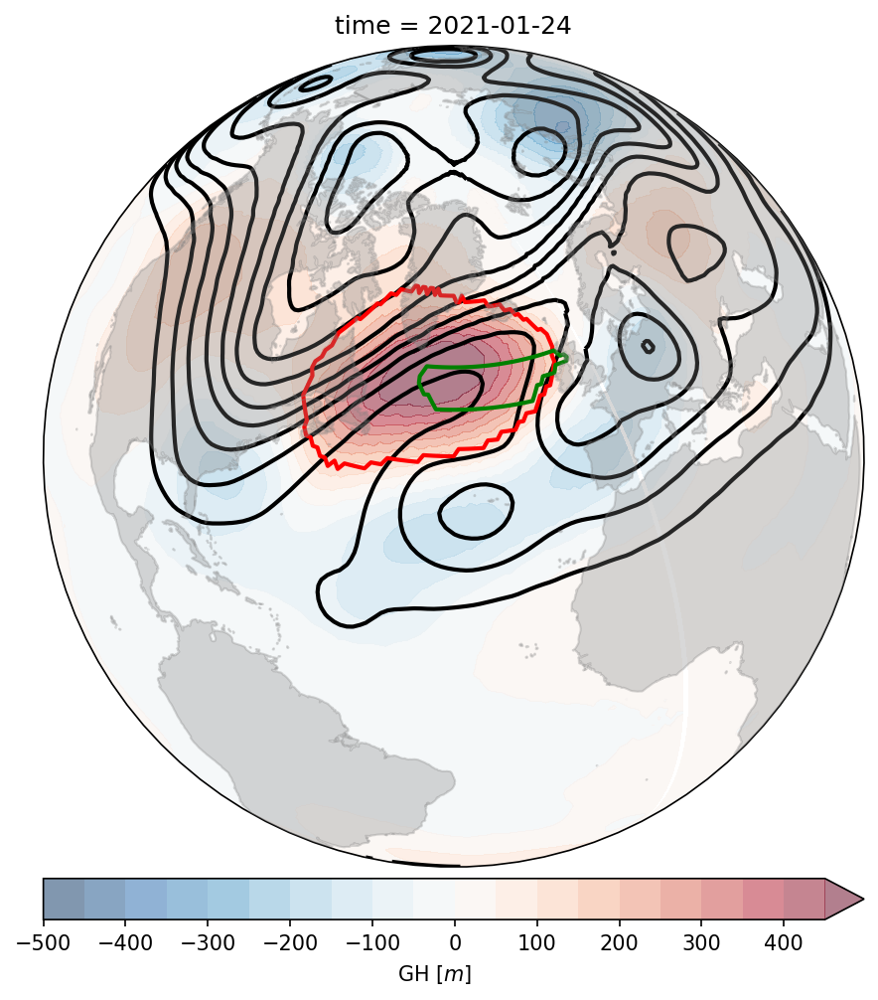

In [40]:
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib.patches as mpatches
import matplotlib.path as mpath

plt.figure(figsize=(14,6),dpi=150)
#fig, ax = plt.subplots(1, 1, figsize=(16, 10), dpi=150, subplot_kw={'projection': ccrs.NorthPolarStereo()})
lon_0 = -35.0
#lat_0 =  70.0
lat_0 =  45
fig, ax = plt.subplots(1, 1, figsize=(6, 8), dpi=150, subplot_kw={'projection':  ccrs.Orthographic(lon_0, lat_0)})
ax.set_global()

### Compute a circle in axes coordinates, which we can use as a boundary
### for the map. We can pan/zoom as much as we like - the boundary will be
### permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)


###=== Shaded plots
###TOA OLR
#(var5).plot.contourf(ax=ax, levels=np.arange(150,200,5), cmap='gray', alpha=0.80,extend = 'min', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'OLR [$w/m^2$]'})
### precipitation
#(var7.sel(time=timc)*30*60*24).plot.contourf(ax=ax, levels=np.arange(2,16,1), cmap='GnBu', alpha=0.80,extend = 'max', \
#                                             transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'pr [$mm/day$]','orientation':'vertical','pad':0.01})

### geop anomaly
ano.zg.sel(time=timb).plot.contourf(ax=ax, levels=np.arange(-500,500,50), cmap='RdBu_r',alpha=0.50, extend = 'max', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'GH [$m$]','orientation':'horizontal','pad':0.01})

###=== Contoured plots
#(var3*0.01).plot.contour(ax=ax, levels=np.arange(980,1050,5), colors='k',linewidths=0.8, transform=ccrs.PlateCarree())
#var0.sel(time=timc).plot.contour(ax=ax, levels=np.arange(4200,5800,100), colors='k',linewidths=2, transform=ccrs.PlateCarree())
im =ax.contour(clon, ano.lat,zg_fil_new, levels=np.arange(4200,5800,100), colors='k',linewidths=2,transform=ccrs.PlateCarree())

###== wind vectors
#q = ax.quiver(lons, lats, u.values, v.values, transform=ccrs.PlateCarree(), color="k", angles="xy",regrid_shape=50)
#qk = ax.quiverkey (q, 0.96, 1.02, 3.0, '3.0 m/s')


###=== Contrack blocks
flevels=[1463.5, 1464.5] ### flag
rlevels=[0.5,1.5]
im1=block_ano.flag.sel(time=timb).plot.contour(ax=ax,levels=flevels,colors='r',linewidths=2,extend = 'neither', transform=ccrs.PlateCarree())
#im1=block_ano.flag.sel(time=date).plot.contourf(ax=ax,levels=flevels,cmap='Greys_r', extend='neither', transform=ccrs.PlateCarree(), alpha=0.2,add_colorbar=False)
#im1=block_ano.flag.sel(time=date).plot.contourf(ax=ax,levels=flevels,cmap='Greys_r',zorder=9, extend='neither', transform=ccrs.PlateCarree(), alpha=0.5,add_colorbar=True)
#ax.add_feature(cf.BORDERS)

###== reservsal index blocks
im2=block_abs.Blocking.sel(time=timc).plot.contour(ax=ax, levels=rlevels, colors='g',linewidths=2, transform=ccrs.PlateCarree())

###== tempest blocks
#im3=block_ano2['object_id'].sel(time=timc).plot.contour(ax=ax, levels=rlevels, colors='b',linewidths=2, transform=ccrs.PlateCarree())


###=== cosmetic: sometimes there is a gap near map edge where track is split:
lonts[lonts >= 355] = 359.9
lonts[lonts <= 3] = 0.1
segment = np.vstack((lonts,latts))

###=== move longitude into the map region and split if longitude jumps by more than "threshold"
lon0 = 0 #center of map
bleft = lon0-0.
bright = lon0+360
segment[0,segment[0]> bright] -= 360
segment[0,segment[0]< bleft]  += 360
threshold = 180  # CHANGE HERE
isplit = np.nonzero(np.abs(np.diff(segment[0])) > threshold)[0]
subsegs = np.split(segment,isplit+1,axis=+1)

###===plot the tracks
#for seg in subsegs:
#    x,y = seg[0],seg[1]
#    ax.plot(x ,y,c = 'm',linewidth=2, transform=ccrs.PlateCarree())

#ax.scatter(lonts[0],latts[0],s=50,c='m',marker="x", zorder=10, transform=ccrs.PlateCarree())

#ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree()); 
##ax.coastlines('110m', alpha=0.5)
import cartopy.feature as cfeature
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='grey',alpha=0.30),zorder=20)

plt.tight_layout()

plt.savefig('sgt_block_'+timc+'_v2.jpg')

In [32]:
### Animation
var8['time']
#tim
#dates

<xarray.DataArray 'time' (time: 7)>
array(['2021-01-20T00:00:00.000000000', '2021-01-21T00:00:00.000000000',
       '2021-01-22T00:00:00.000000000', '2021-01-23T00:00:00.000000000',
       '2021-01-24T00:00:00.000000000', '2021-01-25T00:00:00.000000000',
       '2021-01-26T00:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2021-01-20 2021-01-21 ... 2021-01-26
Attributes:
    axis:     T

In [74]:
#t0=var8['time'][0]
#tn=var8['time'][-1]
#print(t0,tn)
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib.patches as mpatches
import matplotlib.path as mpath

    ### Compute a circle in axes coordinates, which we can use as a boundary
    ### for the map. We can pan/zoom as much as we like - the boundary will be
    ### permanently circular
    
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)

lon_0 = -35.0
lat_0 =  70.0
ini=0
for i in var8['time']:
    
#    print(str(i)[36:49])
    j=var8['time'][0]
    tim=str(j)[36:40]+str(j)[41:43]+str(j)[44:46]+'_12'
    itmp=np.where(dates == tim)
    idx0=int(itmp[0])
    
    tim=str(i)[36:40]+str(i)[41:43]+str(i)[44:46]+'_12'
    print(tim)
    itmp=np.where(dates == tim)
    idxn=int(itmp[0])
     
    lonts = np.asarray(block_df['Longitude'].iloc[np.where(block_df['Flag']==bid)])
    latts = np.asarray(block_df['Latitude'].iloc[np.where(block_df['Flag']==bid)])
    latts = latts[idx0:idxn+1]
    lonts = lonts[idx0:idxn+1]    
    
#    lonts = np.asarray(block_df['Longitude'].iloc[np.where(block_df['Flag']==bid)])
#    latts = np.asarray(block_df['Latitude'].iloc[np.where(block_df['Flag']==bid)])
#    latts= latts[0:ini+1]
#    lonts= lonts[0:ini+1]
#    ini=ini+3
    
    plt.figure(figsize=(14,6),dpi=150)

    fig,ax = plt.subplots(1, 1, figsize=(16, 10), dpi=150, subplot_kw={'projection':  ccrs.Orthographic(lon_0, lat_0)})
    
    
    ax.set_boundary(circle, transform=ax.transAxes)
    
###=== Shaded plots
###humidty
#(var2.sel(time=timc)*1000).plot.contourf(ax=ax, levels=np.arange(0.8,5.2,0.2), cmap='GnBu',extend = 'max', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'Humidity [$g/Kg$]'})
###surface temp
#(var4-273).plot.contourf(ax=ax, levels=np.arange(-35,15,5), cmap='BuPu_r', alpha=0.80,extend = 'min', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'tas [$oC$]'})
###TOA OLR
#(var5).plot.contourf(ax=ax, levels=np.arange(150,200,5), cmap='gray', alpha=0.80,extend = 'min', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'OLR [$w/m^2$]'})
### precipitation
    (var7.sel(time=i)*30*60*24).plot.contourf(ax=ax, levels=np.arange(2,16,1), cmap='GnBu', alpha=0.80,extend = 'max', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'pr [$mm/day$]'})
### geop anomaly
    ano.zg.sel(time=i).plot.contourf(ax=ax, levels=np.arange(150,500,50), cmap='YlOrRd',alpha=0.50, extend = 'max', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'GH [$m$]'})
### Ice 
#    (var8.sel(time=i)).plot.contourf(ax=ax, cmap=cmocean.cm.ice,extend = 'neither', transform=ccrs.PlateCarree(),add_colorbar=True,cbar_kwargs={'label': 'Ice sheet'})

###=== Contoured plots
#(var3*0.01).plot.contour(ax=ax, levels=np.arange(980,1050,5), colors='k',linewidths=0.8, transform=ccrs.PlateCarree())
#    var0.sel(time=i).plot.contour(ax=ax, levels=np.arange(4200,5800,100), colors='k',linewidths=0.8, transform=ccrs.PlateCarree())

### prepare wind
#u=var1[1,...]
#v=vvar1[1,...]
    u=var1.sel(time=i)
    v=vvar1.sel(time=i)
    lons, lats = np.meshgrid(lon, lat)
    q = ax.quiver(lons, lats, u.values, v.values, transform=ccrs.PlateCarree(), color="green", angles="xy",regrid_shape=50)
    qk = ax.quiverkey (q, 0.96, 1.02, 3.0, '3.0 m/s')

    ###Blockings
    flevels=[1463.5, 1464.5] ### flag
    rlevels=[0.5,1.5]
    im1=block_ano.flag.sel(time=i).plot.contour(ax=ax,levels=flevels,colors='r',linewidths=2,extend = 'neither', transform=ccrs.PlateCarree())
#im1=block_ano.flag.sel(time=date).plot.contourf(ax=ax,levels=flevels,cmap='Greys_r', extend='neither', transform=ccrs.PlateCarree(), alpha=0.2,add_colorbar=False)
#im1=block_ano.flag.sel(time=date).plot.contourf(ax=ax,levels=flevels,cmap='Greys_r',zorder=9, extend='neither', transform=ccrs.PlateCarree(), alpha=0.5,add_colorbar=True)
#ax.add_feature(cf.BORDERS)

#    im2=block_abs.Blocking.sel(time=i).plot.contour(ax=ax, levels=rlevels, colors='g',linewidths=2, transform=ccrs.PlateCarree())


#    im3=block_ano2['object_id'].sel(time=i).plot.contour(ax=ax, levels=rlevels, colors='b',linewidths=2, transform=ccrs.PlateCarree())

  # cosmetic: sometimes there is a gap near map edge where track is split:
    lonts[lonts >= 355] = 359.9
    lonts[lonts <= 3] = 0.1
    segment = np.vstack((lonts,latts))

#move longitude into the map region and split if longitude jumps by more than "threshold"
    lon0 = 0 #center of map
    bleft = lon0-0.
    bright = lon0+360
    segment[0,segment[0]> bright] -= 360
    segment[0,segment[0]< bleft]  += 360
    threshold = 180  # CHANGE HERE
    isplit = np.nonzero(np.abs(np.diff(segment[0])) > threshold)[0]
    subsegs = np.split(segment,isplit+1,axis=+1)

#plot the tracks
    for seg in subsegs:
        x,y = seg[0],seg[1]
        ax.plot(x ,y,c = 'm',linewidth=2, transform=ccrs.PlateCarree())

    ax.scatter(lonts[0],latts[0],s=50,c='m',marker="x", zorder=10, transform=ccrs.PlateCarree())

    
    

    ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree()); 
#ax.coastlines('110m', alpha=0.5)
    import cartopy.feature as cfeature
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='grey',alpha=0.30),zorder=20)


    plt.tight_layout()

### Save
    plt.savefig('/home/b/b382006/figures/humidity_block_iconc-c3-'+str(i)[36:49]+'.jpg')
    plt.close()

20230804_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230805_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230806_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230807_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230808_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230809_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230810_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230811_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230812_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


20230813_12


/home/b/b382006/.local/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

<Figure size 2100x900 with 0 Axes>

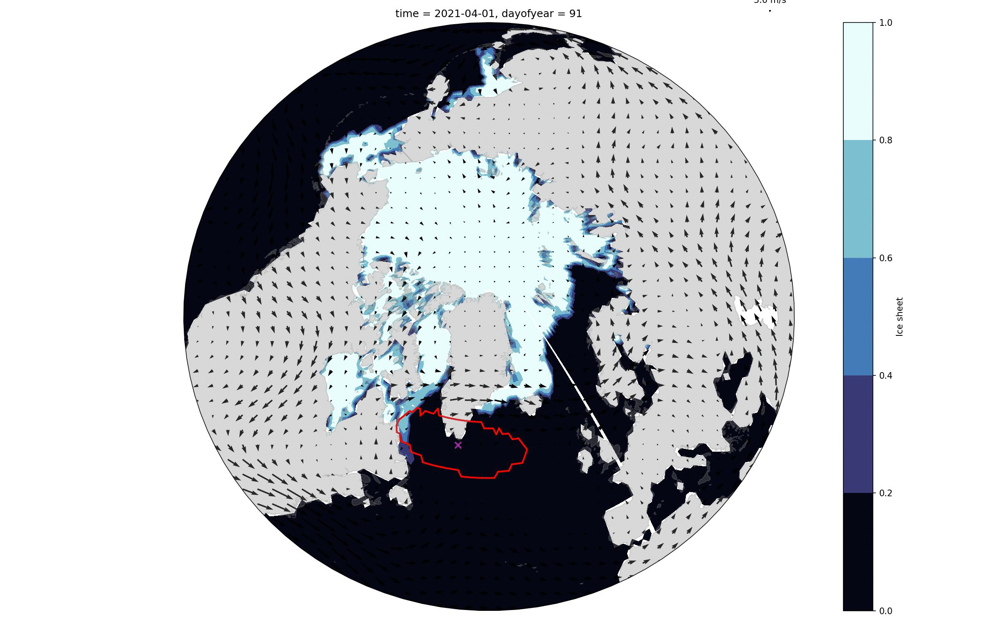

In [23]:
import IPython.display as IPdisplay, matplotlib.font_manager as fm
gif_filepath='/home/b/b382006/figures/humidity_block_icon-c3_case2.gif'
IPdisplay.Image(gif_filepath)

In [76]:
#import IPython.display as IPdisplay, matplotlib.font_manager as fm
#gif_filepath='/home/b/b382006/figures/humidity_block_icon-c3_case-summer.gif'
#IPdisplay.Image(gif_filepath)